In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import random
import json
import warnings
import pickle
import math
import yaml

import tensorflow as tf
from tensorflow.keras import layers, models, activations
import tensorflow.keras as keras
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import numpy as np
from tqdm.notebook import tqdm
import segmentation_models as sm
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import jaccard_score, f1_score, accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
import joblib

import utils
from utils import parse_function, filter_function, augmentation_function, data_pipeline

Segmentation Models: using `tf.keras` framework.


In [3]:
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

Define constants.

In [4]:
DATA_PATH = "C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/"
MODEL_PATH = "C:/Users/Tim/.keras/datasets/greenspace_transfer/models/"
EPOCHS = 40
BATCH_SIZE = 16
LOG_THRESH = 0.5
VAL_SIZE = 0.2

Load bounding boxes of the selected citites.

In [5]:
with open('city_bboxes.json', 'r') as fin:
    city_bboxes = json.load(fin)
city_bboxes

{'Paris': [2.1601868, 48.7344554, 2.5694275, 49.0027448],
 'Amsterdam': [4.7598267, 52.2887426, 4.9898529, 52.4267102],
 'The Hague': [4.2194366, 52.0115132, 4.412384, 52.1022876],
 'Strasbourg': [7.6957512, 48.5592273, 7.7831268, 48.6070359],
 'Rotterdam': [4.432118, 51.9031892, 4.5141792, 51.9404383],
 'Lille': [2.9831314, 50.5984938, 3.1328201, 50.6812322],
 'Edinburgh': [-3.286972, 55.9016884, -3.1151752, 55.9832106],
 'Utrecht': [5.0818634, 52.0569238, 5.1529312, 52.119577],
 'London (UK)': [-0.4524994, 51.3559176, 0.1951244, 51.6346407],
 'Bordeaux': [-0.6794357, 44.7742802, -0.5160141, 44.8899313],
 'London (CA)': [-81.3335037, 42.948884, -81.1669922, 43.0320078],
 'Brussels': [4.2784882, 50.8023547, 4.4398499, 50.8795354],
 'Berlin': [13.3023834, 52.4474309, 13.5121536, 52.5707163],
 'Kyoto': [135.6923103, 34.9350598, 135.7752228, 35.0322454],
 'Vienna': [16.3014793, 48.1824554, 16.397953, 48.2340495],
 'Yaoundé': [11.4685249, 3.8067056, 11.5775299, 3.9010771],
 'Dar es Salaam'

Load filenames for all images from train and transfer cities.

In [9]:
train_cities = list(city_bboxes.keys())[:15]
transfer_cities = list(city_bboxes.keys())[15:]

X = []
Y = []
for city in train_cities:
    img_dir = DATA_PATH+city+"/images/"
    label_dir = DATA_PATH+city+"/labels/"
    X.extend([img_dir+fname for fname in os.listdir(img_dir)])
    Y.extend([label_dir+fname for fname in os.listdir(label_dir)]) 
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=VAL_SIZE, random_state=42)
print(f"train samples: {len(X_train)}")
print(f"validation samples: {len(X_val)}")
print(X_train[:2])
print(Y_train[:2])
    
X_transfer_single = []
Y_transfer_single = []
for city in transfer_cities:
    img_dir = DATA_PATH+city+"/images/"
    label_dir = DATA_PATH+city+"/labels/"
    X_transfer_single.append([img_dir+fname for fname in os.listdir(img_dir)])
    Y_transfer_single.append([label_dir+fname for fname in os.listdir(label_dir)])
X_transfer = [j for sub in X_transfer_single for j in sub]
Y_transfer = [j for sub in Y_transfer_single for j in sub]
print(f"transfer samples: {len(X_transfer)}")
print(X_transfer[:2])
print(Y_transfer[:2])

train samples: 11262
validation samples: 2816
['C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/London (UK)/images/16.32695.21810.png', 'C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/Paris/images/16.33167.22541.png']
['C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/London (UK)/labels/16.32695.21810.png', 'C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/Paris/labels/16.33167.22541.png']
transfer samples: 1204
['C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/Yaoundé/images/16.34855.32068.png', 'C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/Yaoundé/images/16.34856.32066.png']
['C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/Yaoundé/labels/16.34855.32068.png', 'C:/Users/Tim/.keras/datasets/greenspace_transfer/ohsome2label/Yaoundé/labels/16.34856.32066.png']


Create feature pipeline which loads, preprocesses, filters and augments each image in a TensorFlow dataset object.

In [10]:
train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE, train_mode=True)
validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE)
transfer_pipeline = data_pipeline(X_transfer, Y_transfer, batch_size=BATCH_SIZE)
iter_pipe_train = iter(train_pipeline)
iter_pipe_val = iter(validation_pipeline)
iter_pipe_transfer = iter(transfer_pipeline)

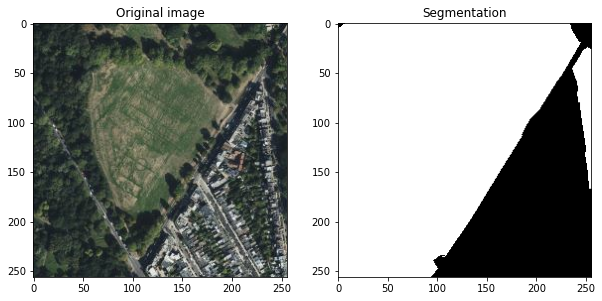

In [11]:
batch = next(iter_pipe_train)
visualize(batch[0][0], batch[1][0], title="Segmentation")

## Baseline

In [49]:
train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE, train_mode=True)
validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE)
transfer_pipeline = data_pipeline(X_transfer, Y_transfer, batch_size=BATCH_SIZE)

In [17]:
clf_baseline = SGDClassifier(loss='log_loss', n_jobs=-1, random_state=42)
for batch in tqdm(train_pipeline):
    resize_shape = batch[0].shape[0]*256*256
    X_batch = tf.reshape(batch[0], (resize_shape, 3)).numpy()
    y_batch = tf.squeeze(tf.reshape(batch[1][..., 1:], (resize_shape, 1))).numpy()
    clf_baseline.partial_fit(X_batch, y_batch, classes=np.array([0., 1.]))
joblib.dump(clf_baseline, MODEL_PATH+f"baseline_log_loss.joblib") 

In [12]:
clf_baseline = joblib.load(MODEL_PATH+f"baseline_log_loss.joblib")
clf_baseline.coef_

array([[-3.31111641, 10.29759223, -9.86229073]])

In [14]:
utils.evaluate_baseline(clf_baseline, validation_pipeline, log_thresh=LOG_THRESH)

[0.8065992120194109,
 0.024909820810949265,
 0.046687378206490555,
 0.4421891816414027,
 0.025965051891237958]

Evaluate model on unseen data from data scarce regions.

In [15]:
metrics_overall = utils.evaluate_baseline(clf_baseline, transfer_pipeline, log_thresh=LOG_THRESH)
results = [["mean", *metrics_overall]]
for city, X_city, Y_city in zip(transfer_cities, X_transfer_single, Y_transfer_single):
    city_pipeline = data_pipeline(X_city, Y_city, batch_size=BATCH_SIZE)
    metrics = utils.evaluate_baseline(clf_baseline, city_pipeline, log_thresh=LOG_THRESH)
    results.append([city, *metrics])
results_df = pd.DataFrame(results,
                          columns=['city', 'accuracy', 'iou_score', 'f1_score', 'precision', 'recall'])
results_df.sort_values(by=['f1_score'], ascending=False)

,city,accuracy,iou_score,f1_score,precision,recall
6,São Paulo,0.910182,0.162923,0.274530,0.304519,0.263051
8,Asunción,0.842079,0.139019,0.241222,0.185580,0.391977
2,Dar es Salaam,0.887370,0.127456,0.226095,0.212704,0.241285
10,Porto Alegre,0.874179,0.099910,0.181616,0.352328,0.124692
0,mean,0.909455,0.097360,0.175059,0.237834,0.148553
3,Kampala,0.913338,0.038146,0.072526,0.095100,0.067187
7,Barranquilla,0.956055,0.007840,0.015534,0.177382,0.008180
9,San Juan,0.927197,0.000229,0.000459,0.123517,0.000230
1,Yaoundé,0.924978,0.000003,0.000006,0.025000,0.000003
4,Douala,0.907471,0.000000,0.000000,0.000000,0.000000


### Vanilla U-Net from scratch

In [29]:
train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE, train_mode=True)
validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE)
transfer_pipeline = data_pipeline(X_transfer, Y_transfer, batch_size=BATCH_SIZE)

In [17]:
def unet_dropout(n_classes=2, input_shape=(256, 256, 3),
                 maps=[32, 64, 128, 256, 512], activation='sigmoid'):
    """
    UNet network using dropout features.
    Adapted from https://github.com/bnsreenu/python_for_microscopists/blob/master/204-207simple_unet_model.py.
    """
    inputs = layers.Input(input_shape)

    # Encoder
    c1 = layers.Conv2D(maps[0], (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Dropout(0.1)(c1)
    c1 = layers.Conv2D(maps[0], (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D(pool_size=(2, 2))(c1)

    c2 = layers.Conv2D(maps[1], (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Dropout(0.1)(c2)
    c2 = layers.Conv2D(maps[1], (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D(pool_size=(2, 2))(c2)

    c3 = layers.Conv2D(maps[2], (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Dropout(0.2)(c3)
    c3 = layers.Conv2D(maps[2], (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D(pool_size=(2, 2))(c3)

    c4 = layers.Conv2D(maps[3], (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Dropout(0.2)(c4)
    c4 = layers.Conv2D(maps[3], (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D(pool_size=(2, 2))(c4)

    # Squeeze
    c5 = layers.Conv2D(maps[4], (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Dropout(0.3)(c5)
    c5 = layers.Conv2D(maps[4], (3, 3), activation='relu', padding='same')(c5)

    # Decoder
    u6 = layers.UpSampling2D(size=(2, 2))(c5)
    m6 = layers.concatenate([u6, c4], axis=3)
    c6 = layers.Conv2D(maps[3], (3, 3), activation='relu', padding='same')(m6)
    c6 = layers.Dropout(0.2)(c6)
    c6 = layers.Conv2D(maps[3], (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.UpSampling2D(size=(2, 2))(c6)
    m7 = layers.concatenate([u7, c3], axis=3)
    c7 = layers.Conv2D(maps[2], (3, 3), activation='relu', padding='same')(m7)
    c7 = layers.Dropout(0.2)(c7)
    c7 = layers.Conv2D(maps[2], (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.UpSampling2D(size=(2, 2))(c7)
    m8 = layers.concatenate([u8, c2], axis=3)
    c8 = layers.Conv2D(maps[1], (3, 3), activation='relu', padding='same')(m8)
    c8 = layers.Dropout(0.1)(c8)
    c8 = layers.Conv2D(maps[1], (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.UpSampling2D(size=(2, 2))(c8)
    m9 = layers.concatenate([u9, c1], axis=3)
    c9 = layers.Conv2D(maps[0], (3, 3), activation='relu', padding='same')(m9)
    c9 = layers.Dropout(0.1)(c9)
    c9 = layers.Conv2D(maps[0], (3, 3), activation='relu', padding='same')(c9)

    c10 = layers.Conv2D(n_classes, (1, 1), activation=activation)(c9)

    model = models.Model(inputs=inputs, outputs=c10, name="UNetDropout")

    return model

In [18]:
n_classes = 1
activation = "sigmoid"
lr = 0.0002
threshold = 0.5
optim = keras.optimizers.Adam(lr)
loss = "binary_crossentropy"
metrics = ["accuracy", sm.metrics.IOUScore(threshold=threshold), sm.metrics.FScore(threshold=threshold),
           keras.metrics.Precision(threshold), keras.metrics.Recall(threshold)]
model_fname = MODEL_PATH+f"unet_vanilla/"
epochs = 40

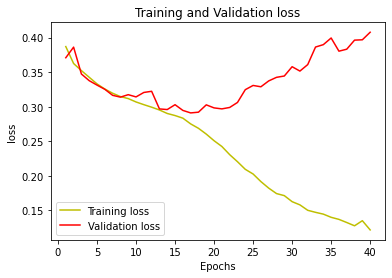

In [29]:
u_net = unet_dropout(n_classes=n_classes, input_shape=(256, 256, 3), activation=activation)
u_net.compile(optim, loss=loss, metrics=metrics)
model_save = tf.keras.callbacks.ModelCheckpoint(model_fname, monitor='val_loss', verbose=0, save_weights_only=True)
u_net_vanilla_hist = u_net.fit(train_pipeline, epochs=epochs, callbacks=[model_save],
                               validation_data=validation_pipeline, verbose=0)
with open(MODEL_PATH+f"unet_vanilla/history.pkl", 'wb') as fout:
    pickle.dump(u_net_vanilla_hist.history, fout)
utils.plot_history(u_net_vanilla_hist, metric='loss')

Load best model.

In [19]:
u_net = unet_dropout(n_classes=n_classes, input_shape=(256, 256, 3), activation=activation)
u_net.compile(optim, loss=loss, metrics=metrics)
u_net.load_weights(model_fname)

In [20]:
u_net.evaluate(validation_pipeline)

146/146 [==============================] - 17s 74ms/step - loss: 0.4077 - accuracy: 0.8648 - iou_score: 0.4616 - f1-score: 0.6265 - precision: 0.6596 - recall: 0.6229


[0.4077201783657074,
 0.8647757172584534,
 0.4616021513938904,
 0.6265136003494263,
 0.6596430540084839,
 0.6228574514389038]

Evaluate model on unseen data from data scarce regions.

In [37]:
metrics_overall = u_net.evaluate(transfer_pipeline, verbose=0)
results = [["mean", *metrics_overall]]
for city, X_city, Y_city in zip(transfer_cities, X_transfer_single, Y_transfer_single):
    city_pipeline = data_pipeline(X_city, Y_city, batch_size=BATCH_SIZE)
    metrics = u_net.evaluate(city_pipeline, verbose=0)
    results.append([city, *metrics])
results_df = pd.DataFrame(results,
                          columns=['city', 'loss', 'accuracy', 'iou_score', 'f1_score', 'precision', 'recall'])
results_df.to_csv("results/unet_vanilla.csv", index=False)
results_df.sort_values(by=['f1_score'], ascending=False)

,city,loss,accuracy,iou_score,f1_score,precision,recall
10,Porto Alegre,0.336950,0.902084,0.249265,0.398407,0.648897,0.291822
9,San Juan,0.250728,0.928914,0.233970,0.377524,0.518170,0.306517
2,Dar es Salaam,0.715986,0.799335,0.177265,0.301147,0.197466,0.634069
8,Asunción,0.329167,0.906005,0.175935,0.289789,0.318442,0.302576
6,São Paulo,0.264448,0.927769,0.175665,0.288233,0.437396,0.253675
0,mean,0.357812,0.906212,0.139379,0.233142,0.279181,0.245619
3,Kampala,0.509855,0.834721,0.105495,0.184125,0.112975,0.323006
7,Barranquilla,0.310345,0.932922,0.054598,0.101954,0.113907,0.076189
4,Douala,0.952334,0.593725,0.017757,0.034894,0.022362,0.079376
1,Yaoundé,0.663545,0.924513,0.008695,0.016984,0.210153,0.013291


## Pretrained Backbone

In [21]:
lr = 0.0002
optim = keras.optimizers.Adam(lr)
threshold = 0.5
n_classes = 1
activation = "sigmoid"
loss = "binary_crossentropy"
metrics = ["accuracy", sm.metrics.IOUScore(threshold=threshold), sm.metrics.FScore(threshold=threshold),
           keras.metrics.Precision(), keras.metrics.Recall()]
epochs = 40

Fitting unet with seresnext50


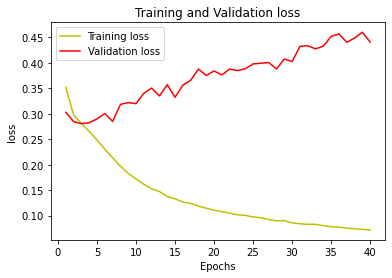

In [16]:
for i, architecture in enumerate([sm.Unet]):
    arch_name = "unet" if i == 0 else "fpn"
    for backbone in ["resnet34", "resnet50", "efficientnetb3", "seresnext50"]:
        print(f"Fitting {arch_name} with {backbone}")
        train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE,
                               train_mode=True, augment=False)
        validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE) 
        
        model = architecture(backbone, encoder_weights="imagenet", input_shape=(256, 256, 3),
                             classes=n_classes, activation=activation, encoder_freeze=True)
        model.compile(optim, loss=loss, metrics=metrics)

        model_fname = MODEL_PATH+f"{arch_name}_frozen_{backbone}_noaug/"
        model_save = tf.keras.callbacks.ModelCheckpoint(model_fname, monitor='val_loss',
                                                        verbose=0, save_weights_only=True)
        history = model.fit(train_pipeline, epochs=epochs, callbacks=[model_save],
                            validation_data=validation_pipeline, verbose=0)

        with open(model_fname+"history.pkl", 'wb') as fout:
            pickle.dump(history.history, fout)  # save history as pickle

        utils.plot_history(history, metric='loss')  # plot learning curve

Evaluate models on unseen data from data scarce regions.

In [22]:
scores = dict()
for backbone in ["resnet34", "resnet50", "seresnext50"]:
    train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE, train_mode=True, augment=False)
    validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE) 
    transfer_pipeline = data_pipeline(X_transfer, Y_transfer, batch_size=BATCH_SIZE)
    
    model = sm.Unet(backbone, encoder_weights="imagenet", input_shape=(256, 256, 3),
                         classes=n_classes, activation=activation, encoder_freeze=True)
    model.compile(optim, loss=loss, metrics=metrics)
    
    model_fname = MODEL_PATH+f"unet_frozen_{backbone}_noaug/"
    model.load_weights(model_fname)  # load best model
    scores[backbone] = model.evaluate(validation_pipeline)
    
with open('results/scores_backbone_frozen_noaug.pkl', 'wb') as fout:
    pickle.dump(scores, fout)

146/146 [==============================] - 30s 150ms/step - loss: 0.4408 - accuracy: 0.8768 - iou_score: 0.4797 - f1-score: 0.6429 - precision_1: 0.6760 - recall_1: 0.6204


Find out best model according to epoch with best validation set performance.

In [23]:
max_pair = ("", [-math.inf, -math.inf, -math.inf, -math.inf, -math.inf, -math.inf])
for model, score in scores.items():
    if max_pair[1][3] < score[3]:
        max_pair = (model, score)
        
model = sm.Unet(max_pair[0], encoder_weights="imagenet", input_shape=(256, 256, 3),
                     classes=n_classes, activation=activation, encoder_freeze=True)
model.compile(optim, loss=loss, metrics=metrics)
model_fname_best = MODEL_PATH+f"unet_frozen_{max_pair[0]}_noaug/"
model.load_weights(model_fname_best)

print(f"best model: {max_pair[0]} with F1 of {max_pair[1][3]}")

best model: resnet50 with F1 of 0.6501702666282654


Evaluate results per city.

In [24]:
metrics_overall = model.evaluate(transfer_pipeline, verbose=0)
results = [["mean", *metrics_overall]]
for city, X_city, Y_city in zip(transfer_cities, X_transfer_single, Y_transfer_single):
    city_pipeline = data_pipeline(X_city, Y_city, batch_size=BATCH_SIZE)
    metrics = model.evaluate(city_pipeline, verbose=0)
    results.append([city, *metrics])
results_df = pd.DataFrame(results,
                          columns=['city', 'loss', 'accuracy', 'iou_score', 'f1_score', 'precision', 'recall'])
results_df.to_csv("results/transfer_best_frozen_noaug.csv", index=False)
results_df.sort_values(by=['f1_score'], ascending=False)

,city,loss,accuracy,iou_score,f1_score,precision,recall
10,Porto Alegre,0.258357,0.909783,0.355994,0.523266,0.654199,0.428551
9,San Juan,0.269147,0.911076,0.228861,0.367479,0.385589,0.377543
8,Asunción,0.323381,0.889766,0.227296,0.366220,0.310948,0.474844
2,Dar es Salaam,0.458175,0.836609,0.218470,0.358598,0.244833,0.669849
6,São Paulo,0.275436,0.897694,0.200481,0.321285,0.297587,0.381683
0,mean,0.383660,0.869639,0.155954,0.261661,0.647696,0.611199
3,Kampala,0.482067,0.825243,0.109992,0.181157,0.117134,0.366720
7,Barranquilla,0.334708,0.911822,0.076288,0.136114,0.117210,0.152107
1,Yaoundé,1.028473,0.664894,0.044506,0.083403,0.058488,0.238584
4,Douala,0.940201,0.616725,0.027477,0.053484,0.034662,0.117029


## Pretrained Backbone + augmentations

In [12]:
lr = 0.0002
optim = keras.optimizers.Adam(lr)
threshold = 0.5
n_classes = 1
activation = "sigmoid"
loss = "binary_crossentropy"
metrics = ["accuracy", sm.metrics.IOUScore(threshold=threshold), sm.metrics.FScore(threshold=threshold),
           keras.metrics.Precision(), keras.metrics.Recall()]
epochs = 40

Fitting unet with resnet34


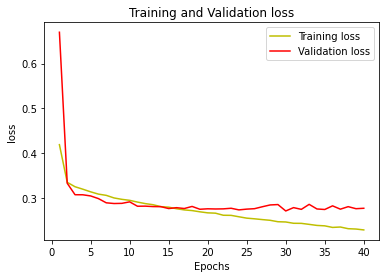

204/204 [==============================] - 12s 59ms/step - loss: 0.2182 - accuracy: 0.9133 - iou_score: 0.4830 - f1-score: 0.6420 - precision: 0.7156 - recall: 0.6263
Fitting unet with resnet50


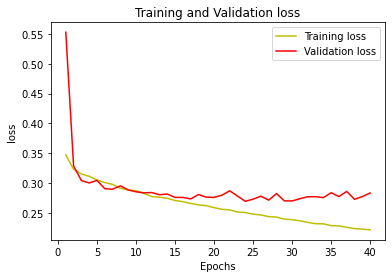

204/204 [==============================] - 16s 80ms/step - loss: 0.2171 - accuracy: 0.9181 - iou_score: 0.4999 - f1-score: 0.6586 - precision: 0.7418 - recall: 0.6311
Fitting unet with efficientnetb3


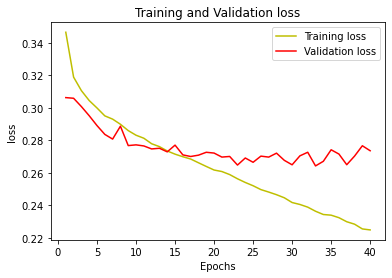

204/204 [==============================] - 20s 99ms/step - loss: 0.2072 - accuracy: 0.9182 - iou_score: 0.5152 - f1-score: 0.6731 - precision: 0.7254 - recall: 0.6640
Fitting unet with seresnext50


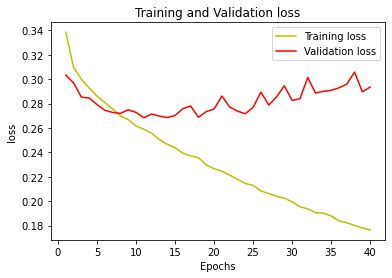

204/204 [==============================] - 30s 146ms/step - loss: 0.1897 - accuracy: 0.9300 - iou_score: 0.5725 - f1-score: 0.7227 - precision: 0.7681 - recall: 0.7128


In [16]:
for i, architecture in enumerate([sm.Unet]):
    arch_name = "unet" if i == 0 else "fpn"
    for backbone in ["resnet34", "resnet50", "efficientnetb3", "seresnext50"]:
        print(f"Fitting {arch_name} with {backbone}")
        train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE,
                               train_mode=True, augment=True)
        validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE) 
        transfer_pipeline = data_pipeline(X_transfer, Y_transfer, batch_size=BATCH_SIZE)
        
        model = architecture(backbone, encoder_weights="imagenet", input_shape=(256, 256, 3),
                             classes=n_classes, activation=activation, encoder_freeze=True)
        model.compile(optim, loss=loss, metrics=metrics)

        model_fname = MODEL_PATH+f"{arch_name}_frozen_{backbone}/"
        model_save = tf.keras.callbacks.ModelCheckpoint(model_fname, monitor='val_loss',
                                                        verbose=0, save_weights_only=True)
        history = model.fit(train_pipeline, epochs=epochs, callbacks=[model_save],
                            validation_data=validation_pipeline, verbose=0)

        with open(model_fname+"history.pkl", 'wb') as fout:
            pickle.dump(history.history, fout)  # save history as pickle

        utils.plot_history(history, metric='loss')  # plot learning curve

Evaluate models on unseen data from data scarce regions.

In [13]:
scores = dict()
for backbone in ["resnet34", "resnet50", "seresnext50"]:
    train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE, train_mode=True, augment=True)
    validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE) 
    transfer_pipeline = data_pipeline(X_transfer, Y_transfer, batch_size=BATCH_SIZE)
    
    model = sm.Unet(backbone, encoder_weights="imagenet", input_shape=(256, 256, 3),
                    classes=n_classes, activation=activation, encoder_freeze=True)
    model.compile(optim, loss=loss, metrics=metrics)
    
    model_fname = MODEL_PATH+f"unet_frozen_{backbone}/"
    model.load_weights(model_fname)  # load best model
    scores[backbone] = model.evaluate(validation_pipeline)
    
with open('results/architecture_backbone_scores.pkl', 'wb') as fout:
    pickle.dump(scores, fout)

146/146 [==============================] - 29s 151ms/step - loss: 0.2935 - accuracy: 0.8822 - iou_score: 0.5088 - f1-score: 0.6686 - precision: 0.7255 - recall: 0.6318


Find out best model according to epoch with best validation set performance.

In [14]:
max_pair = ("", [-math.inf, -math.inf, -math.inf, -math.inf, -math.inf, -math.inf])
for model, score in scores.items():
    if max_pair[1][3] < score[3]:
        max_pair = (model, score)
        
model = sm.Unet(max_pair[0], encoder_weights="imagenet", input_shape=(256, 256, 3),
                classes=n_classes, activation=activation, encoder_freeze=True)
model.compile(optim, loss=loss, metrics=metrics)
model_fname_best = MODEL_PATH+f"unet_frozen_{max_pair[0]}/"
model.load_weights(model_fname_best)

print(f"best model: {max_pair[0]} with F1 of {max_pair[1][3]}")

best model: seresnext50 with F1 of 0.6686317920684814


Evaluate results per city.

In [15]:
metrics_overall = model.evaluate(transfer_pipeline, verbose=0)
results = [["mean", *metrics_overall]]
for city, X_city, Y_city in zip(transfer_cities, X_transfer_single, Y_transfer_single):
    city_pipeline = data_pipeline(X_city, Y_city, batch_size=BATCH_SIZE)
    metrics = model.evaluate(city_pipeline, verbose=0)
    results.append([city, *metrics])
results_df = pd.DataFrame(results,
                          columns=['city', 'loss', 'accuracy', 'iou_score', 'f1_score', 'precision', 'recall'])
results_df.to_csv("results/transfer_best_frozen.csv", index=False)
results_df.sort_values(by=['f1_score'], ascending=False)

,city,loss,accuracy,iou_score,f1_score,precision,recall
10,Porto Alegre,0.217446,0.920499,0.434123,0.602810,0.686856,0.545518
6,São Paulo,0.165854,0.940564,0.309750,0.454996,0.574213,0.454102
8,Asunción,0.246061,0.913742,0.292721,0.447704,0.409466,0.529860
9,San Juan,0.192900,0.933789,0.265145,0.412843,0.580565,0.319240
0,mean,0.251511,0.915540,0.233577,0.363856,0.711038,0.623266
2,Dar es Salaam,0.450656,0.823208,0.153116,0.265569,0.185262,0.468770
3,Kampala,0.325472,0.883897,0.141375,0.236147,0.192044,0.391960
5,Butembo,0.443374,0.915453,0.131857,0.221492,0.182320,0.102714
7,Barranquilla,0.303078,0.917430,0.081169,0.145029,0.124452,0.143614
1,Yaoundé,0.444277,0.851673,0.052869,0.096959,0.113651,0.152523


# Pretrained Backbone fine tuned + augmentations

Load best model model that has converged and set encoder weights to be trainable. Fine tune with a very low learning rate as to not overfit the large encoder part.

In [12]:
lr = 0.00001
optim = keras.optimizers.Adam(lr)
threshold = 0.5
n_classes = 1
activation = "sigmoid"
loss = "binary_crossentropy"
encoder = "seresnext50"
metrics = ["accuracy", sm.metrics.IOUScore(threshold=threshold), sm.metrics.FScore(threshold=threshold),
           keras.metrics.Precision(), keras.metrics.Recall()]
epochs = 5

In [17]:
model = sm.Unet(encoder, encoder_weights="imagenet", input_shape=(256, 256, 3),
                classes=n_classes, activation=activation, encoder_freeze=False)
model.compile(optim, loss=loss, metrics=metrics)
model_fname_best = MODEL_PATH+f"unet_frozen_seresnext50/"
model.load_weights(model_fname_best)

Epoch 1/5
579/579 [==============================] - 622s 1s/step - loss: 0.3004 - accuracy: 0.8624 - iou_score: 0.4556 - f1-score: 0.6197 - precision_2: 0.6745 - recall_2: 0.5897 - val_loss: 0.2830 - val_accuracy: 0.8742 - val_iou_score: 0.4746 - val_f1-score: 0.6366 - val_precision_2: 0.7000 - val_recall_2: 0.6128
Epoch 2/5
579/579 [==============================] - 644s 1s/step - loss: 0.2767 - accuracy: 0.8768 - iou_score: 0.4975 - f1-score: 0.6585 - precision_2: 0.7136 - recall_2: 0.6309 - val_loss: 0.2674 - val_accuracy: 0.8810 - val_iou_score: 0.5282 - val_f1-score: 0.6868 - val_precision_2: 0.6898 - val_recall_2: 0.7002
Epoch 3/5
579/579 [==============================] - 608s 1s/step - loss: 0.2636 - accuracy: 0.8842 - iou_score: 0.5166 - f1-score: 0.6765 - precision_2: 0.7389 - recall_2: 0.6421 - val_loss: 0.2580 - val_accuracy: 0.8881 - val_iou_score: 0.5291 - val_f1-score: 0.6867 - val_precision_2: 0.7273 - val_recall_2: 0.6751
Epoch 4/5
579/579 [===========================

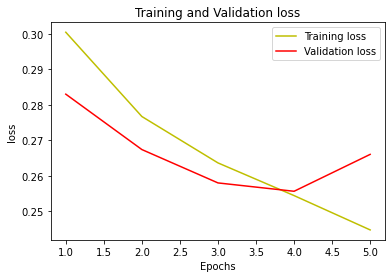

In [31]:
train_pipeline = data_pipeline(X_train, Y_train, batch_size=BATCH_SIZE,
                               train_mode=True, augment=True)
validation_pipeline = data_pipeline(X_val, Y_val, batch_size=BATCH_SIZE) 
transfer_pipeline = data_pipeline(X_transfer, Y_transfer, batch_size=BATCH_SIZE)

model_fname = MODEL_PATH+f"unet_finetuned_{backbone}/"
model_save = tf.keras.callbacks.ModelCheckpoint(model_fname, monitor='val_loss',
                                                verbose=0, save_weights_only=True)
history = model.fit(train_pipeline, epochs=epochs, callbacks=[model_save],
                    validation_data=validation_pipeline)

with open(model_fname+"history.pkl", 'wb') as fout:
    pickle.dump(history.history, fout)  # save history as pickle

utils.plot_history(history, metric='loss')  # plot learning curve

Load best model.

In [13]:
model = sm.Unet(encoder, encoder_weights="imagenet", input_shape=(256, 256, 3),
                classes=n_classes, activation=activation, encoder_freeze=True)
model.compile(optim, loss=loss, metrics=metrics)
model_fname_best = MODEL_PATH+f"unet_finetuned_{encoder}/"
model.load_weights(model_fname_best)

In [14]:
model.evaluate(validation_pipeline)

146/146 [==============================] - 35s 167ms/step - loss: 0.2660 - accuracy: 0.8827 - iou_score: 0.4841 - f1-score: 0.6469 - precision: 0.7585 - recall: 0.5780


[0.2660166323184967,
 0.8826878070831299,
 0.48410332202911377,
 0.646946907043457,
 0.7585350871086121,
 0.5780043005943298]

Evaluate results per city.

In [22]:
metrics_overall = model.evaluate(transfer_pipeline, verbose=0)
results = [["mean", *metrics_overall]]
for city, X_city, Y_city in zip(transfer_cities, X_transfer_single, Y_transfer_single):
    city_pipeline = data_pipeline(X_city, Y_city, batch_size=BATCH_SIZE)
    metrics = model.evaluate(city_pipeline, verbose=0)
    results.append([city, *metrics])
results_df = pd.DataFrame(results,
                          columns=['city', 'loss', 'accuracy', 'iou_score', 'f1_score', 'precision', 'recall'])
results_df.to_csv("results/transfer_best_frozen.csv", index=False)
results_df.sort_values(by=['f1_score'], ascending=False)

,city,loss,accuracy,iou_score,f1_score,precision,recall
10,Porto Alegre,0.169941,0.934934,0.503661,0.662612,0.749610,0.637392
6,São Paulo,0.183392,0.936622,0.305325,0.454522,0.532813,0.477810
9,San Juan,0.176983,0.934986,0.290149,0.445904,0.584776,0.362387
8,Asunción,0.197810,0.921371,0.287409,0.437571,0.440813,0.466043
0,mean,0.203143,0.927464,0.250632,0.386154,0.456634,0.389106
2,Dar es Salaam,0.369467,0.814616,0.233147,0.378134,0.245137,0.826595
7,Barranquilla,0.204204,0.924749,0.095669,0.167347,0.156112,0.159171
3,Kampala,0.224550,0.917257,0.094015,0.160726,0.201485,0.205373
1,Yaoundé,0.257178,0.919223,0.068505,0.125626,0.318393,0.095824
5,Butembo,0.311642,0.922911,0.036794,0.070160,0.164218,0.058239


## Visualize examples

In [17]:
def visualize_results(batch, model):
    imgs = batch[0]
    seg_maps = batch[1]
    preds = []
    for i in range(imgs.shape[0]):
        img = imgs[i, ...]
        seg_map = seg_maps[i, ...]
        pred_map = tf.where(model(tf.expand_dims(img, axis=0)) > 0.5, 1, 0)
        preds.append(pred_map)
        fig, axarr = plt.subplots(1, 3, figsize=(15, 5))
        axarr[0].imshow(img.numpy())
        axarr[1].imshow(seg_map.numpy().squeeze(), cmap="gray")
        axarr[2].imshow(pred_map.numpy().squeeze(), cmap="gray")
        plt.show()
    return imgs, seg_maps, preds

From train data.

In [27]:
iter_pipe_train = iter(train_pipeline)

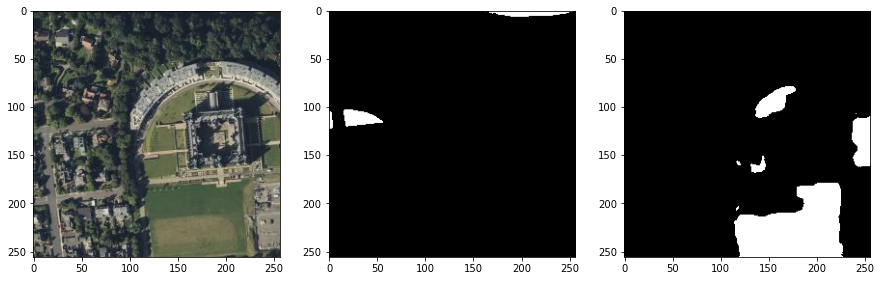

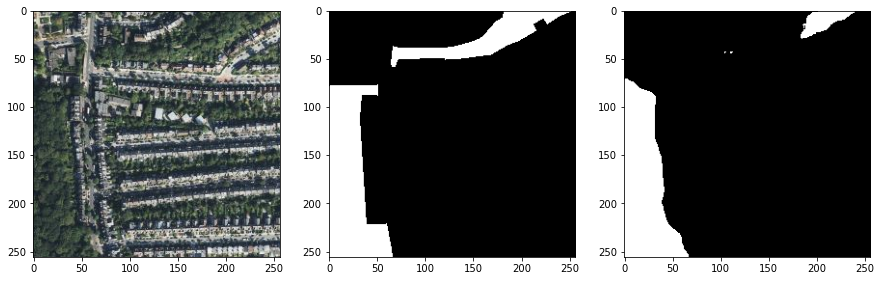

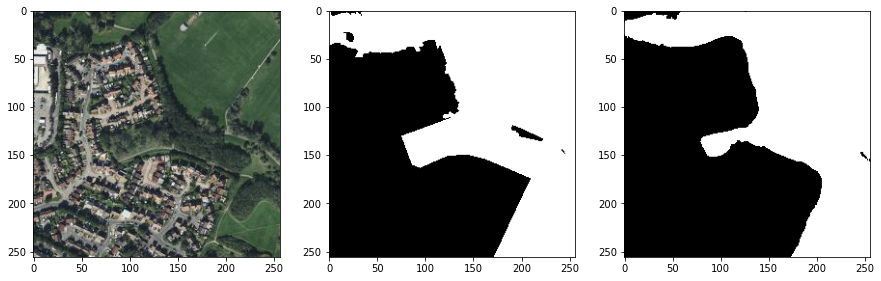

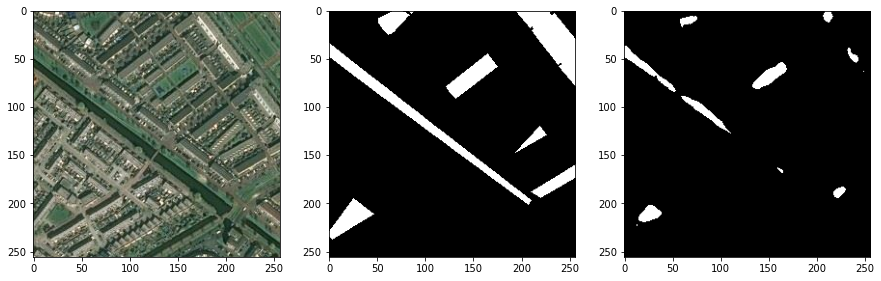

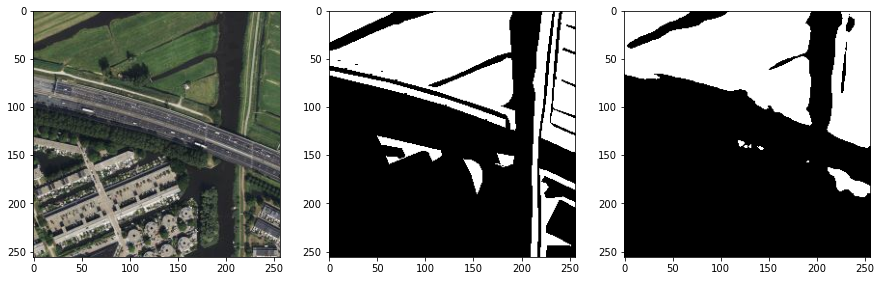

...

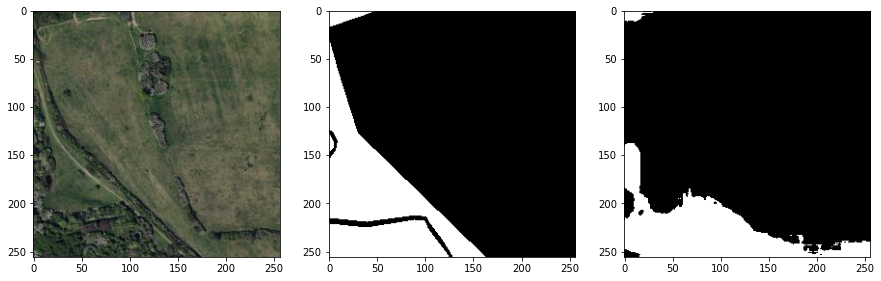

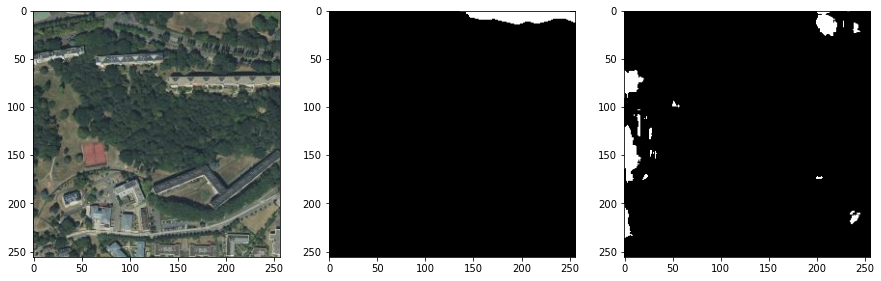

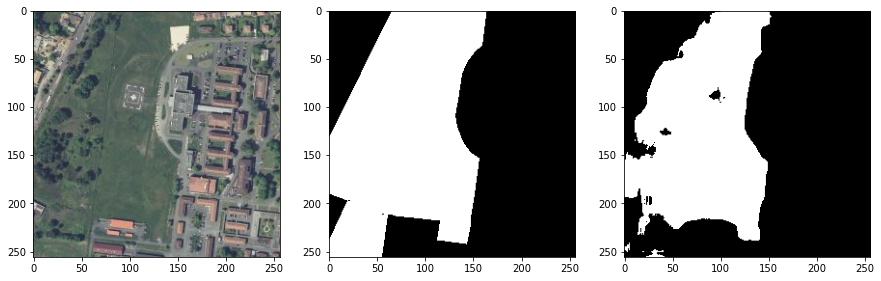

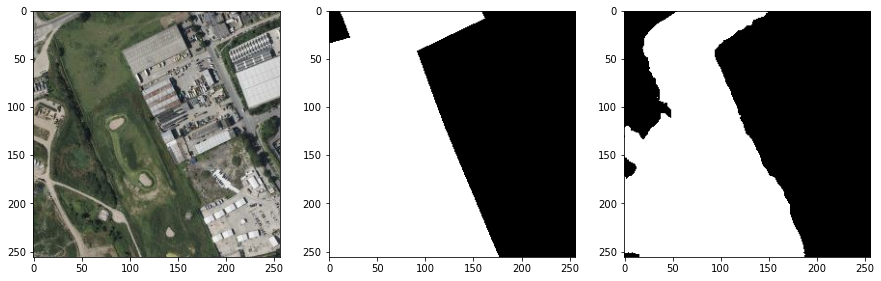

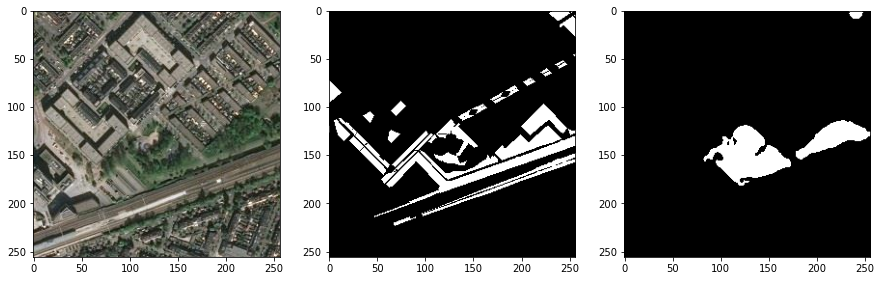

In [34]:
batch = next(iter_pipe_train)
imgs, seg_maps, preds = visualize_results(batch, model)

From validation data.

In [36]:
iter_pipe_val = iter(validation_pipeline)

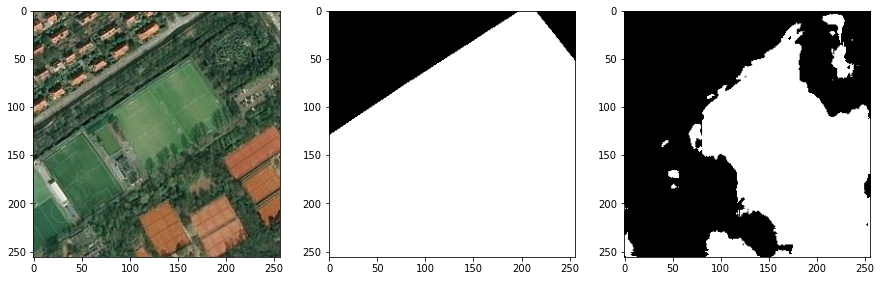

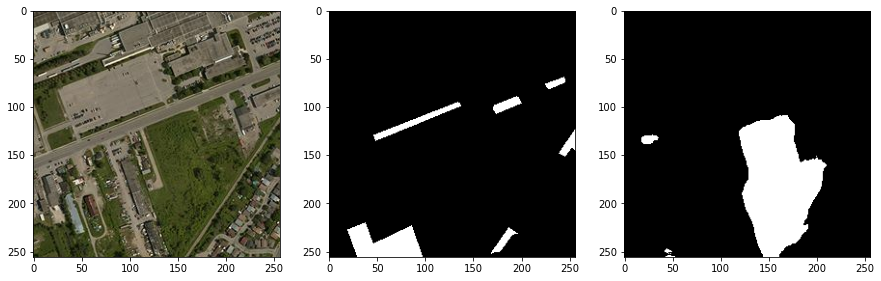

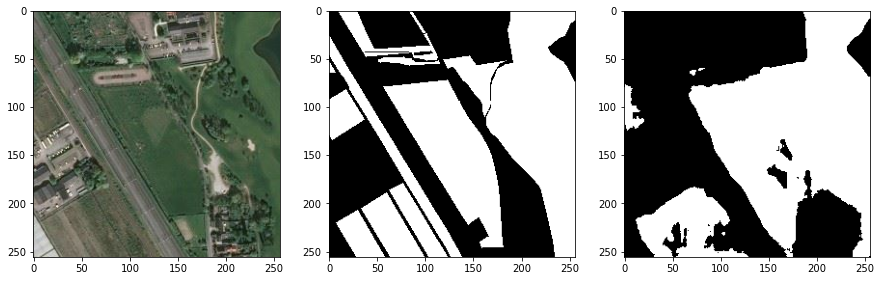

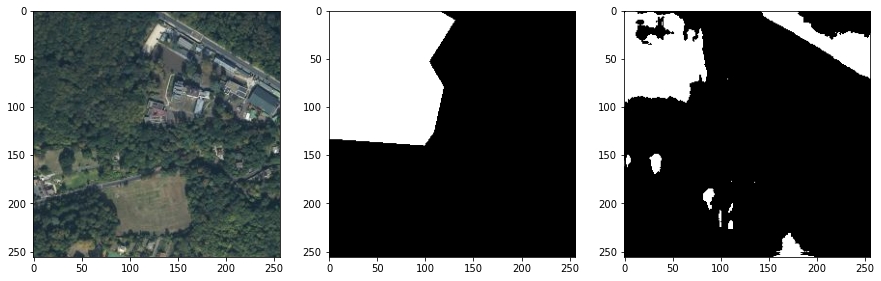

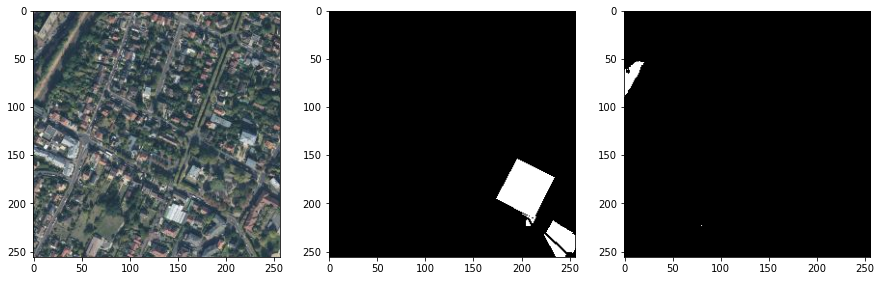

...

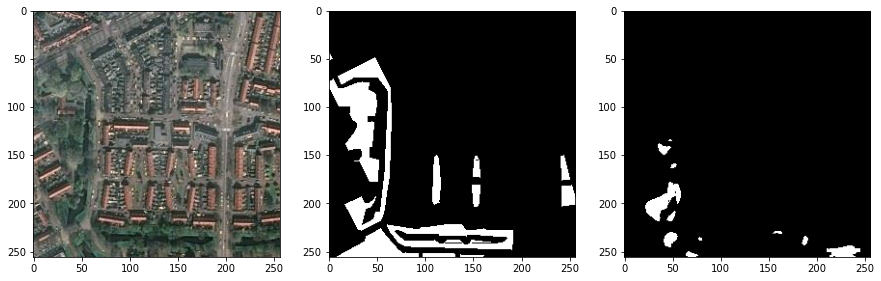

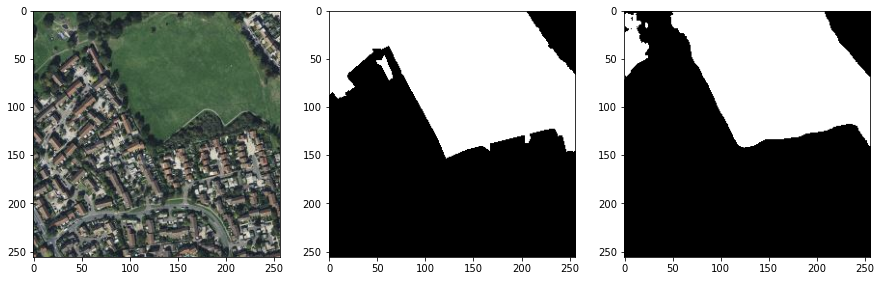

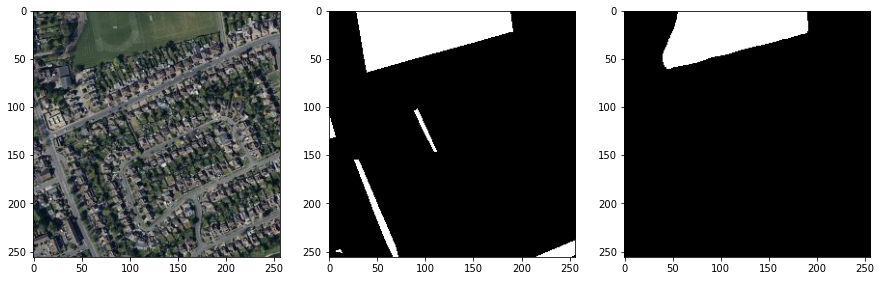

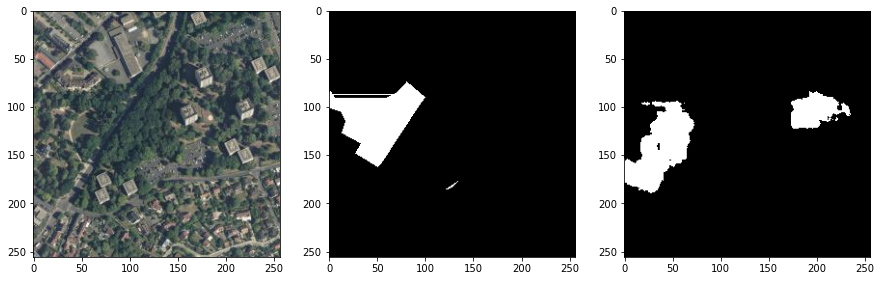

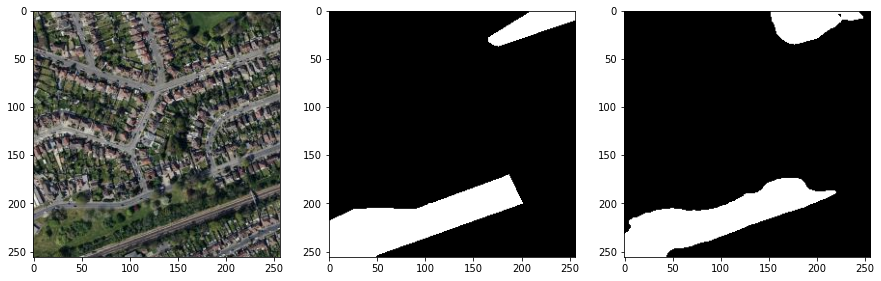

In [43]:
batch = next(iter_pipe_val)
imgs, seg_maps, preds = visualize_results(batch, model)

From transfer data.

In [46]:
iter_pipe_transfer = iter(transfer_pipeline)

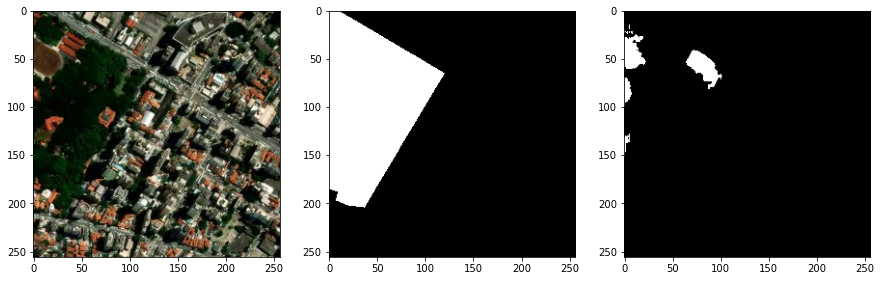

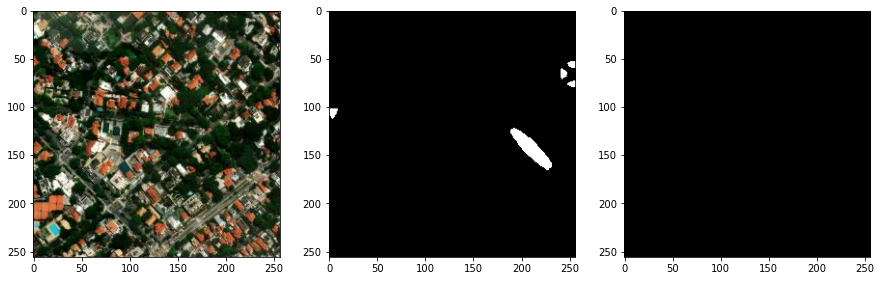

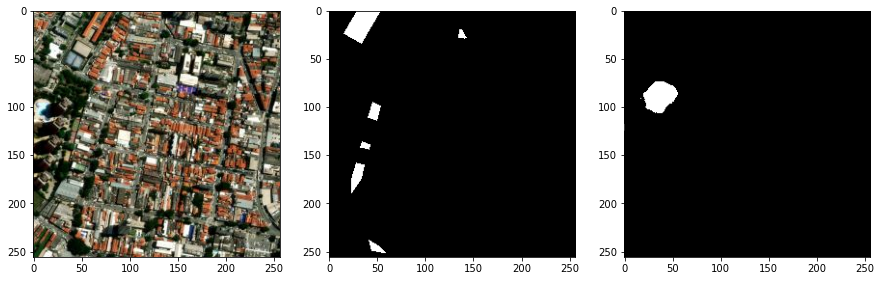

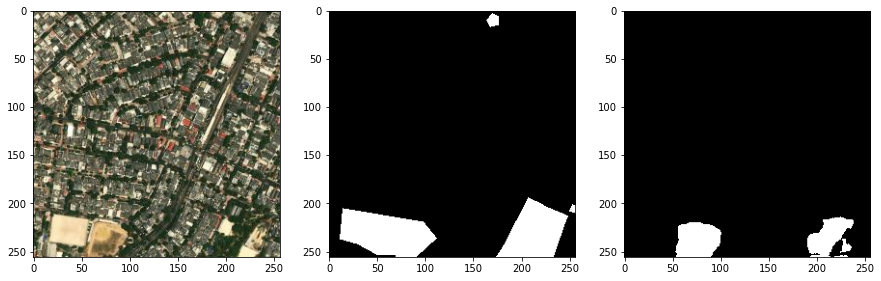

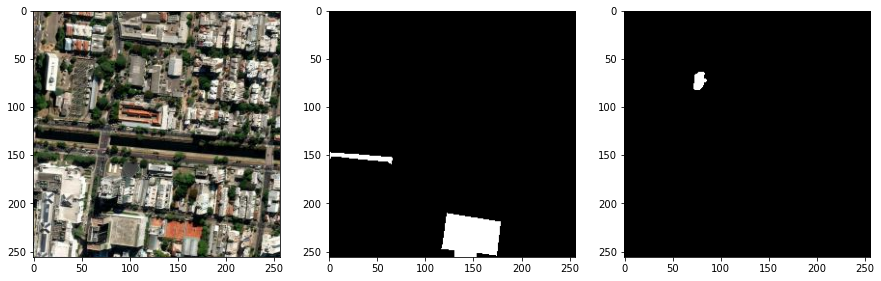

...

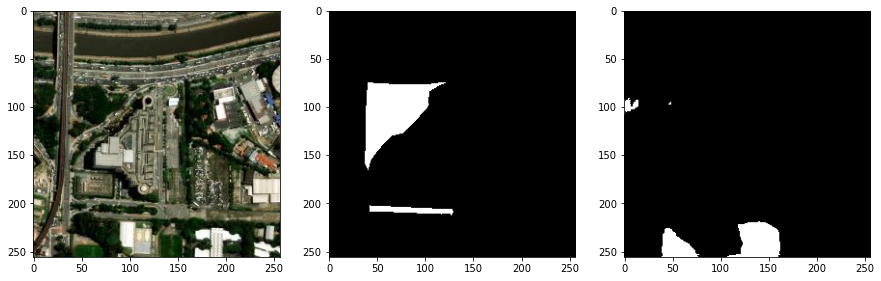

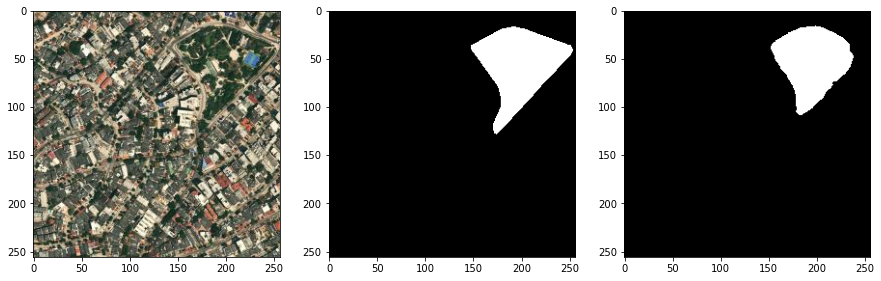

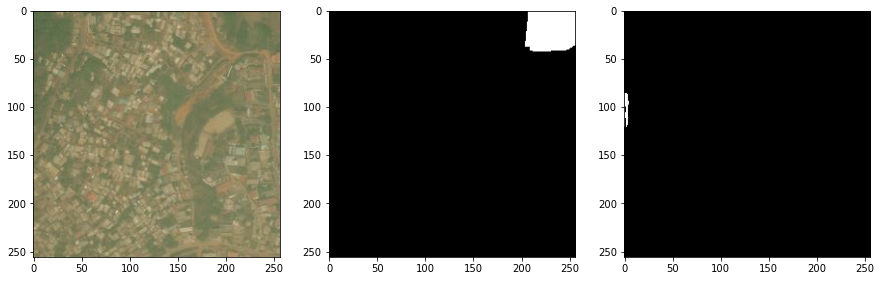

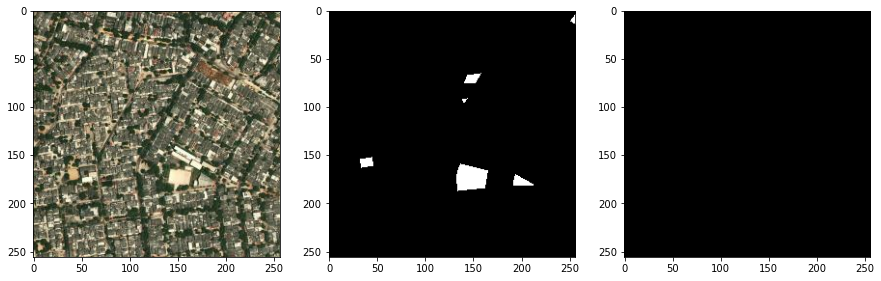

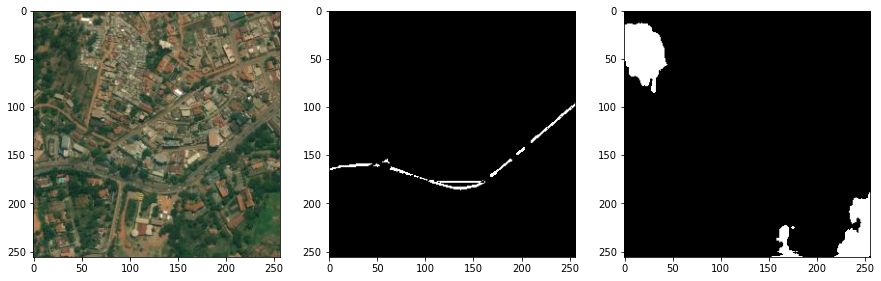

In [56]:
batch = next(iter_pipe_transfer)
imgs, seg_maps, preds = visualize_results(batch, model)

Pick images to save.

In [26]:
saved_imgs = []
saved_seg_maps = []
saved_preds = []

In [57]:
idx = 12

saved_imgs.append(imgs[idx])
saved_seg_maps.append(seg_maps[idx])
saved_preds.append(preds[idx])

### Plotting saved images

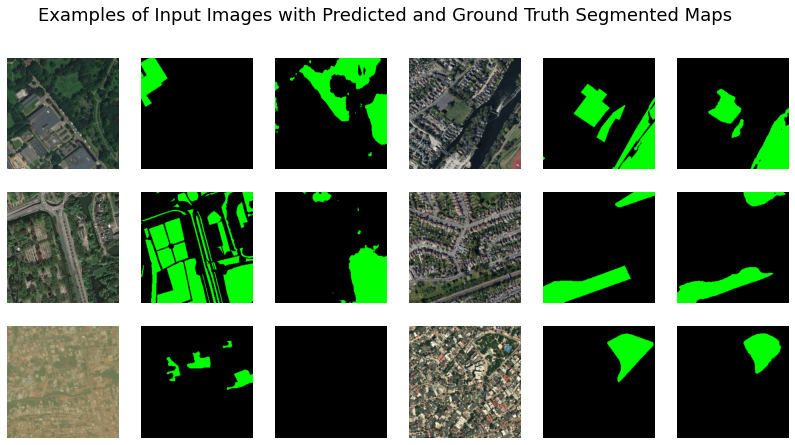

In [99]:
flattened_imgs = [item for sublist in zip(saved_imgs, saved_seg_maps, saved_preds) for item in sublist]
fig, axarr = plt.subplots(3, 6, figsize=(14, 7))
fig.suptitle("Examples of Input Images with Predicted and Ground Truth Segmented Maps", fontsize=18)
i = 0
for row in range(3):
    for col in range(6):
        img = flattened_imgs[i]
        if len(img.shape) > 3:
            img = tf.cast(img, tf.float32).numpy()[0, ...]
        if img.shape[2] == 1:
            img = np.concatenate([img, img, img], axis=2)
            img[..., 0] = 0
            img[..., 2] = 0
        axarr[row, col].imshow(img)
        axarr[row, col].axis('off')
        i += 1

plt.savefig(f'plots/example_predictions.png', bbox_inches='tight', dpi=120)
plt.show()